# Extracción de texto de imágenes

In [55]:
import glob

import pytesseract
from docx import Document

from PIL import Image

In [28]:
## Unir todas las líneas entre dos líneas vacías consecutivas
def seperar_texto_por_parrafos(texto: str):
    resultado = []
    bloque_actual = []

    for linea in texto.split("\n"):
        if linea.strip() == '':
            if bloque_actual:  # Si hay líneas en el bloque actual, unirlas y añadir al resultado
                resultado.append(' '.join(bloque_actual))
                bloque_actual = []  # Reiniciar el bloque actual
        else:
            bloque_actual.append(linea.strip())  # Agregar la línea al bloque actual

    # Si quedaron líneas sin añadir al final del bucle
    if bloque_actual:
        resultado.append(' '.join(bloque_actual))
    
    return resultado

In [29]:
file = "/home/aaguayoo/Downloads/ACT-1994-12-12.tif"
image = Image.open(file)

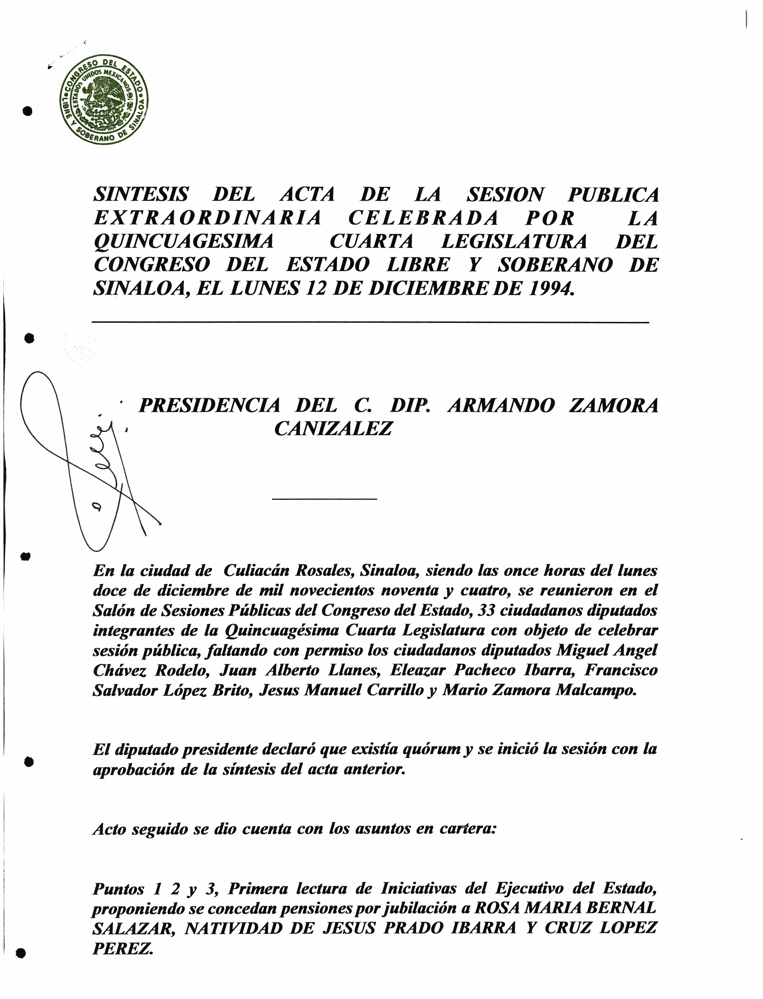

In [30]:
display(image)

In [31]:
text = pytesseract.image_to_string(file)

In [32]:
seperar_texto_por_parrafos(text)

['SINTESIS DEL ACTA DE LA _ SESION PUBLICA EXTRAORDINARIA CELEBRADA POR LA QUINCUAGESIMA CUARTA LEGISLATURA DEL CONGRESO DEL ESTADO LIBRE Y SOBERANO DE SINALOA, EL LUNES 12 DE DICITEMBRE DE 1994.',
 'PRESIDENCIA DEL C. DIP. ARMANDO ZAMORA CANIZALEZ',
 'En la ciudad de Culiacan Rosales, Sinaloa, siendo las once horas del lunes doce de diciembre de mil novecientos noventa y cuatro, se reunieron en el Salon de Sesiones Publicas del Congreso del Estado, 33 ciudadanos diputados integrantes de la Quincuagésima Cuarta Legislatura con objeto de celebrar sesion publica, faltando con permiso los ciudadanos diputados Miguel Angel Chavez Rodelo, Juan Alberto Llanes, Eleazar Pacheco Ibarra, Francisco Salvador Lopez Brito, Jesus Manuel Carrillo y Mario Zamora Malcampo.',
 'El diputado presidente declaro que existia quorum y se inicio la sesion con la aprobacion de la sintesis del acta anterior.',
 'Acto seguido se dio cuenta con los asuntos en cartera:',
 'Puntos 1 2 y 3, Primera lectura de Iniciati

In [61]:
# Encontrar path de archivos tif:
# Entrar a terminal
# Ir a la carpeta (cd)
# $ pwd
# /path/to/image-directory/

lista_textos = []
lista_documentos = []
lista_documentos_parrafos = []
for file in glob.glob("/home/aaguayoo/Downloads/*.tif"):
    text = pytesseract.image_to_string(file)
    lista_textos.append(text)
    lista_documentos.append(file)
    lista_documentos_parrafos.append(seperar_texto_por_parrafos(text))

In [38]:
"texto".find("hola")

-1

In [76]:
# Modificar lista de nombres
lista_nombres = [
    "El diputado presidente", 
    "El diputado Tarsicio Silva", 
]

In [70]:
coincidencias = {}
for file, parrafos in zip(lista_documentos, lista_documentos_parrafos):
    # Cada doc es una lista de parrafos
    coincidencias[file] = {
        "sintesis": parrafos[0],
        "lista_nombres": [],
    }
    for nombre in lista_nombres:
        for num, parrafo in enumerate(parrafos):
            # Cada parrafo es un str
            index = parrafo.find(nombre)
            if index != -1:
                print(f"Se encontró nombre en parrafo {num+1}")
                coincidencias[file]["lista_nombres"].append({
                    "nombre": nombre,
                    "parrafo": parrafo
                })

Se encontró nombre en parrafo 4
Se encontró nombre en parrafo 22


In [71]:
coincidencias

{'/home/aaguayoo/Downloads/ACT-1994-12-12.tif': {'sintesis': 'SINTESIS DEL ACTA DE LA _ SESION PUBLICA EXTRAORDINARIA CELEBRADA POR LA QUINCUAGESIMA CUARTA LEGISLATURA DEL CONGRESO DEL ESTADO LIBRE Y SOBERANO DE SINALOA, EL LUNES 12 DE DICITEMBRE DE 1994.',
  'lista_nombres': [{'nombre': 'El diputado presidente',
    'parrafo': 'El diputado presidente declaro que existia quorum y se inicio la sesion con la aprobacion de la sintesis del acta anterior.'},
   {'nombre': 'El diputado Tarsicio Silva',
    'parrafo': 'El diputado Tarsicio Silva intervino para referirse al mismo asunto expuesto por el diputado Alejandro Camacho, exhortando a los membros de la comision para que en su entrevista con el Procurador le den a conocer todas las situaciones de este caso.'}]}}

# Guardar info en archivo .docx

In [75]:
# Crear un nuevo documento .docx
doc = Document()

# Agregar título
doc.add_heading('Datos de Personas', level=1)
doc.add_paragraph()  # Añadir un párrafo en blanco

# Iterar sobre el diccionario y agregar datos
for file, info in coincidencias.items():
    doc.add_heading(file.split("/")[-1], level=2)
    doc.add_paragraph(info["sintesis"])
    for nombre in info["lista_nombres"]:
        doc.add_paragraph(f".Nombre: {nombre['nombre']}")
        doc.add_paragraph(f"Párrafo: {nombre['parrafo']}")
    doc.add_paragraph()  # Añadir un párrafo en blanco después de cada entrada

# Guardar el documento .docx
doc.save('datos_personas.docx')